# BAX493 - Final Project

#### Team 2

The project concept is to aim at developing an intelligent book recommendation system that leverages user data and machine learning techniques to suggest books to users based on their individual preferences and reading habits.

- Data source from https://www.kaggle.com/datasets/zygmunt/goodbooks-10k



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import warnings

from keras.layers import Input, Embedding, Flatten, Dot, Dense
from keras.models import Model

warnings.filterwarnings('ignore')
%matplotlib inline

**Imported Data**

**The data sets have been cleaned in Big Query*

- Rating is for training model and developing recommendation system
- Book is for making recommendations

In [56]:
data = pd.read_csv("/Users/lxyisla1129/Downloads/rating.csv")
recommend = pd.read_csv("/Users/lxyisla1129/Downloads/book.csv")
# Display the dataset
data.head()

,book_id,user_id,rating
0,256,21724,1
1,256,3050,1
2,256,35866,1
3,256,11927,1
4,256,6063,1


In [5]:
# Check the data info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 980112 entries, 0 to 980111
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   book_id  980112 non-null  int64
 1   user_id  980112 non-null  int64
 2   rating   980112 non-null  int64
dtypes: int64(3)
memory usage: 22.4 MB


In [57]:
recommend.head()

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,7450,5557442,5557442,5728574,11,NaN,9.789771e+12,يوسف زيدان,2006.0,ظل الأفعى,...,8299,10879,1593,1708,2203,3013,2312,1643,https://images.gr-assets.com/books/1409365252m...,https://images.gr-assets.com/books/1409365252s...
1,5890,207034,207034,969,24,440421241,9.780440e+12,Jeanne DuPrau,2006.0,The Prophet of Yonwood,...,22237,23844,2106,1487,4480,8323,5642,3912,https://images.gr-assets.com/books/1320636285m...,https://images.gr-assets.com/books/1320636285s...
2,1640,4929705,4929705,4995331,59,1565125967,9.781565e+12,Robert Goolrick,2009.0,A Reliable Wife,...,58348,68241,9542,4195,10812,24592,20908,7734,https://images.gr-assets.com/books/1404576577m...,https://images.gr-assets.com/books/1404576577s...
3,8124,10365343,10365343,15268500,27,385528078,9.780386e+12,Colson Whitehead,2010.0,NaN,...,12370,13845,2515,1015,2302,4488,4284,1756,https://images.gr-assets.com/books/1327888785m...,https://images.gr-assets.com/books/1327888785s...
4,5322,395851,395851,385351,72,006102001X,9.780061e+12,L.J. Smith,1991.0,The Struggle,...,23840,29037,1058,1337,4057,9093,7745,6805,https://s.gr-assets.com/assets/nophoto/book/11...,https://s.gr-assets.com/assets/nophoto/book/50...


In [8]:
# Chech the book info
recommend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         10000 non-null  int64  
 1   book_id                    10000 non-null  int64  
 2   best_book_id               10000 non-null  int64  
 3   work_id                    10000 non-null  int64  
 4   books_count                10000 non-null  int64  
 5   isbn                       9300 non-null   object 
 6   isbn13                     9415 non-null   float64
 7   authors                    10000 non-null  object 
 8   original_publication_year  9979 non-null   float64
 9   original_title             9415 non-null   object 
 10  title                      10000 non-null  object 
 11  language_code              8916 non-null   object 
 12  average_rating             10000 non-null  float64
 13  ratings_count              10000 non-null  int6

**EDA** 

In [13]:
import plotly.graph_objs as go
from plotly.offline import  init_notebook_mode, iplot
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
from wordcloud import WordCloud,STOPWORDS
import plotly_express as px
%matplotlib inline

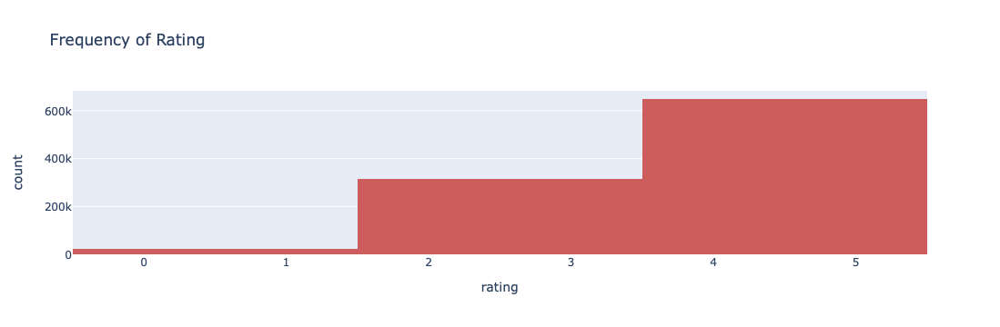

In [75]:
fig = px.histogram(data, x = 'rating', title='Frequency of Rating',
                   labels={'values': 'Values'}, # renaming the axis
                   nbins=4, # number of bins
                   color_discrete_sequence=['indianred']) # changing bar color)
fig.show()

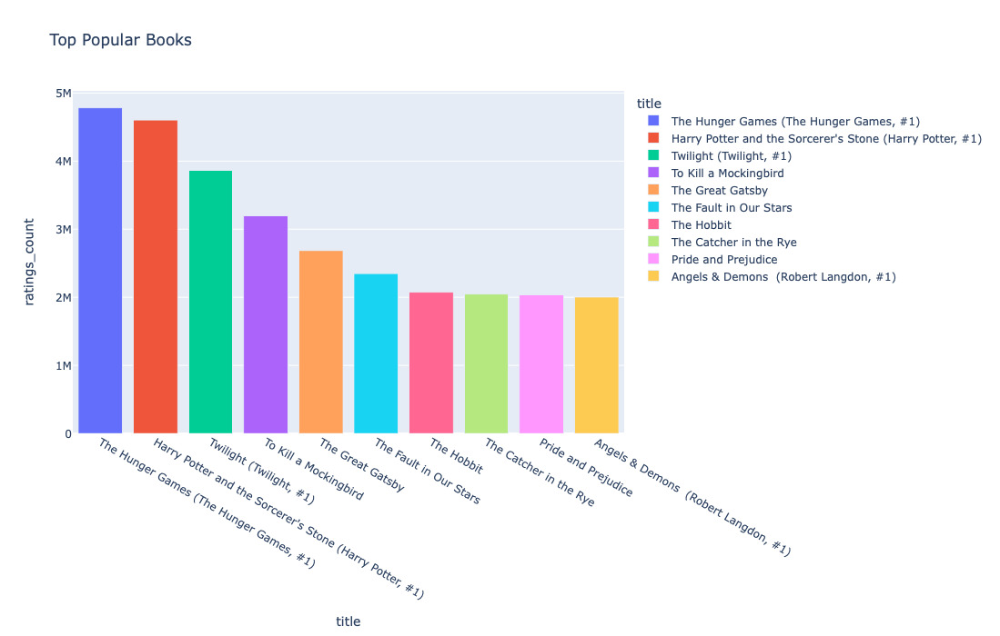

In [22]:
# The top 10 books with the most people rate
top_popular = recommend.sort_values('ratings_count', ascending=False)
ten_top_popular = top_popular[:10]
fig = px.bar(ten_top_popular, x="title", y="ratings_count", title='Top Popular Books', color='title',
             width=1500, height=700)
fig.show()

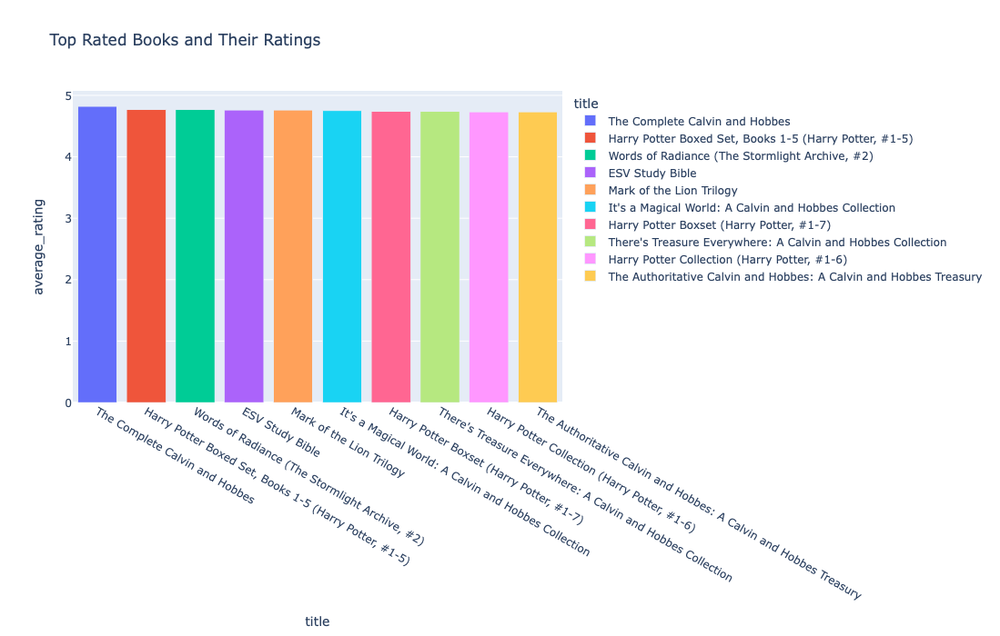

In [26]:
# The top 10 books with highest average rating
top_rated = recommend.sort_values('average_rating', ascending=False)
tt_top_rated = top_rated[:10]

fig = px.bar(tt_top_rated, x="title", y="average_rating", title='Top Rated Books and Their Ratings',
             color='title', width=1500, height=700)
fig.show()

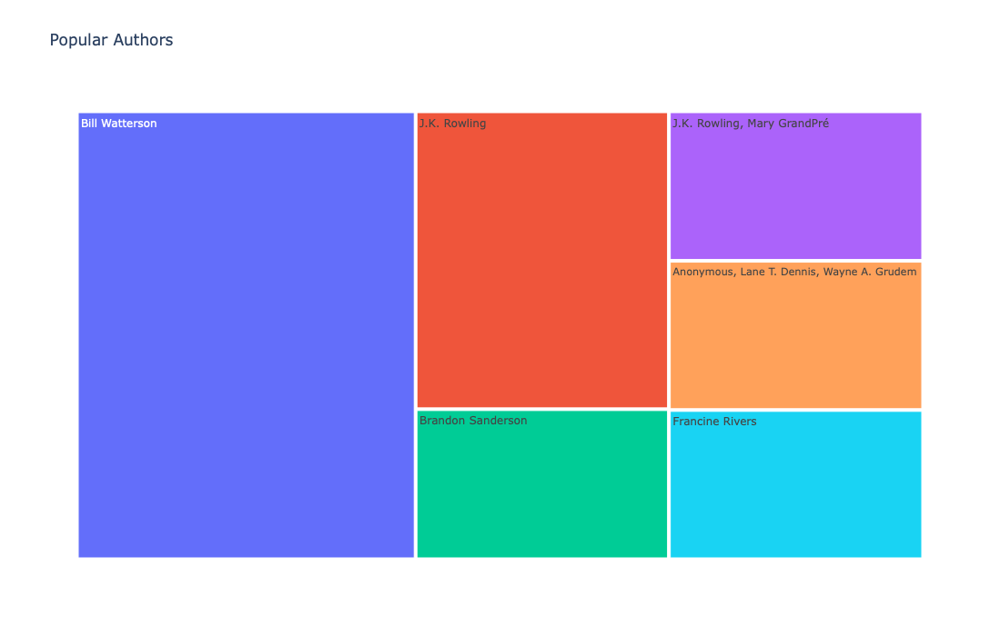

In [27]:
# The top 10 authors whose books have highest rating
ten_top_authors = top_rated[:10]
fig = px.treemap(ten_top_authors, path=['authors'], values='average_rating',title='Popular Authors', width=1000, height=700)
fig.show()

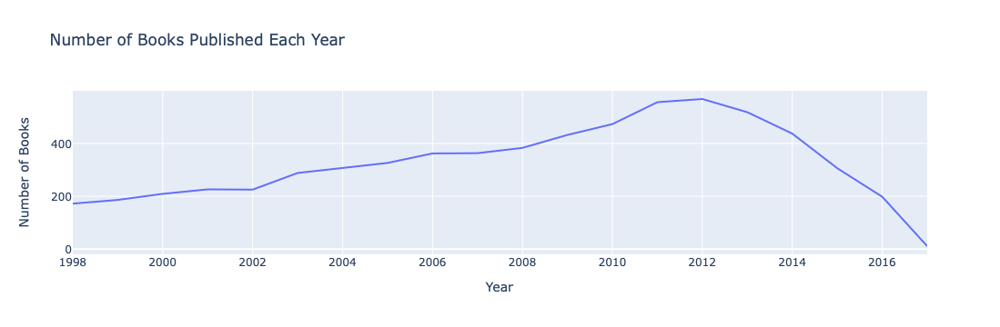

In [68]:
# Popular years of publishing
recommend = recommend.dropna(subset = ['original_publication_year'])
recommend = recommend[recommend['original_publication_year'] > 0]

publish = recommend.groupby('original_publication_year')['id'].count().reset_index()

publish.columns = ['Year', 'Number of Books']
publish = publish.sort_values('Year')

fig = px.line(publish.tail(20), x='Year', y='Number of Books', title='Number of Books Published Each Year')
fig.show()

In [77]:
stop_words=set(STOPWORDS)
author_string = " ".join(recommend['authors'])
title_string = " ".join(recommend['title'])
# cross_author_string = " ".join(merge_data['book_author'].astype(str))
# cross_title_string = " ".join(merge_data['book_title'].astype(str))
# cross_publisher_string = " ".join(merge_data['publisher'].astype(str))

In [78]:
def wordcloud(string):
    wc = WordCloud(width=800,height=500,mask=None,random_state=21, max_font_size=110,stopwords=stop_words).generate(string)
    fig=plt.figure(figsize=(16,8))
    plt.axis('off')
    plt.imshow(wc)

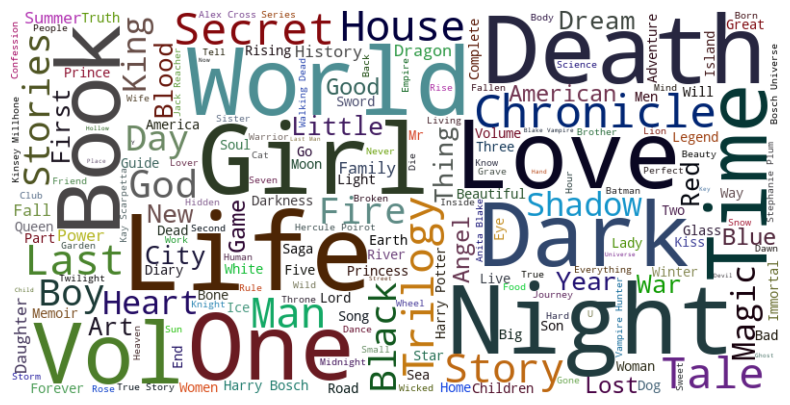

In [84]:
# Generate the title wordcloud
# wordcloud = wordcloud(title_string)

import random

def random_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    h = int(360.0 * random.random())
    s = int(100.0 * random.random())
    l = int(50.0 * random.random())
    return "hsl({}, {}%, {}%)".format(h, s, l)

# Generate a word cloud image with a white background
wordcloud = WordCloud(
    width = 800,
    height = 400,
    background_color='white',  # Set background color to white
    random_state=21,
    max_font_size=110,
    color_func=random_color_func
).generate(title_string)

# Display the generated image:
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

**Train Model (using TensorFlow in jupyter note book)**

In [92]:
# generate indices
num_users = data['user_id'].nunique()
num_books = data['book_id'].nunique()

In [116]:
# Define tensorflow layers
import tensorflow as tf
from tensorflow.keras import layers, Model
def recommendefNet(number_users, num_books, embedding_size):
    # Input layers
    user_input = layers.Input(shape=(1,))
    book_input = layers.Input(shape=(1,))
    
    # Embedding layers
    user_embedding = layers.Embedding(num_users, embedding_size, embeddings_initializer='he_normal',
                                      embeddings_regularizer=tf.keras.regularizers.l2(1e-6))(user_input)
    book_embedding = layers.Embedding(num_books, embedding_size, embeddings_initializer='he_normal',
                                      embeddings_regularizer=tf.keras.regularizers.l2(1e-6))(book_input)
    
    # Remove the unnecessary dimension of size 1
    user_embedding = layers.Reshape((embedding_size,))(user_embedding)
    book_embedding = layers.Reshape((embedding_size,))(book_embedding)
    
    # Compute the dot product between user and book embeddings
    x = layers.Dot(axes=1)([user_embedding, book_embedding])
    
    # Add bias and activation function
    user_bias = layers.Embedding(num_users, 1)(user_input)
    book_bias = layers.Embedding(num_books, 1)(book_input)
    user_bias = layers.Reshape((1,))(user_bias)
    book_bias = layers.Reshape((1,))(book_bias)

    x = layers.Add()([x, user_bias, book_bias])
    x = layers.Activation('sigmoid')(x)
    x = layers.Lambda(lambda x: x * 4 + 1)(x)  # Scale output from 1 to 5
    
    # Create and return model
    model = Model(inputs=[user_input, book_input], outputs=x)
    return model

In [96]:
# Split the data
from sklearn.model_selection import train_test_split
x = data[['user_id', 'book_id']].values
y = data['rating'].values

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [100]:
x_train.shape

(784089, 2)

In [101]:
x_test.shape

(196023, 2)

In [117]:
# Train the model
model = recommendefNet(num_users, num_books, embedding_size=50)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mean_squared_error',
    metrics=['mean_squared_error'])
    
history = model.fit(
    [x_train[:, 0], x_train[:, 1]], y_train,
    batch_size=64,
    epochs=5,
    verbose=1,
    validation_data=([x_test[:, 0], x_test[:, 1]], y_test)
)

Epoch 1/5
12252/12252 ━━━━━━━━━━━━━━━━━━━━ 150s 12ms/step - loss: 1.3789 - mean_squared_error: 1.3746 - val_loss: 0.7916 - val_mean_squared_error: 0.7697
Epoch 2/5
12252/12252 ━━━━━━━━━━━━━━━━━━━━ 164s 13ms/step - loss: 0.6647 - mean_squared_error: 0.6353 - val_loss: 0.7342 - val_mean_squared_error: 0.6914
Epoch 3/5
12252/12252 ━━━━━━━━━━━━━━━━━━━━ 171s 14ms/step - loss: 0.4986 - mean_squared_error: 0.4492 - val_loss: 0.7561 - val_mean_squared_error: 0.6942
Epoch 4/5
12252/12252 ━━━━━━━━━━━━━━━━━━━━ 165s 13ms/step - loss: 0.3843 - mean_squared_error: 0.3167 - val_loss: 0.7919 - val_mean_squared_error: 0.7142
Epoch 5/5
12252/12252 ━━━━━━━━━━━━━━━━━━━━ 169s 14ms/step - loss: 0.3175 - mean_squared_error: 0.2359 - val_loss: 0.8214 - val_mean_squared_error: 0.7332


Text(0, 0.5, 'Training Error')

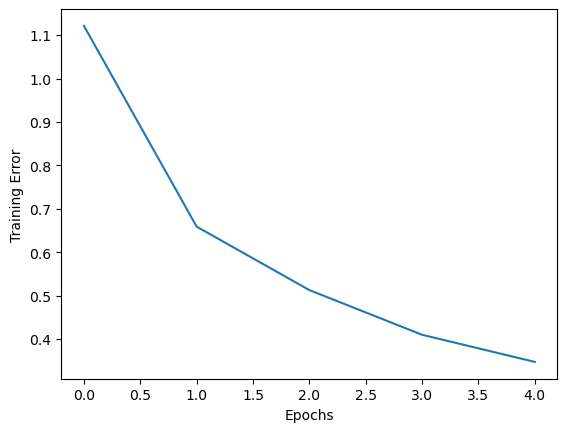

In [133]:
plt.plot(history.history['loss'])
plt.xlabel("Epochs")
plt.ylabel("Training Error")

In [119]:
# Evaluate the model
model.evaluate([x_test[:, 0], x_test[:, 1]], y_test)

6126/6126 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.8198 - mean_squared_error: 0.7316


[0.8214017152786255, 0.7332301139831543]

In [132]:
predictions = model.predict([x_test[:10, 0], x_test[:10, 1]])

predictions[0:10]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


array([[4.018753 ],
       [3.8424504],
       [3.6057909],
       [2.6766062],
       [3.7578678],
       [4.7403164],
       [2.375556 ],
       [3.5864134],
       [4.442686 ],
       [3.8989341]], dtype=float32)

**Making recommendations using TensorFlow Recommendation system**

For the first user, recommend sample books for his/her.

In [196]:
# Creating a dataset for making recommendatinos
book = np.array(list(set(data.book_id)))
book[:5]

array([1, 2, 3, 4, 5])

In [197]:
user = np.array([1 for i in range(len(book))])
user[:5]

array([1, 1, 1, 1, 1])

In [198]:
# Make a prediction
predictions = model.predict([user, book])

predictions = np.array([a[0] for a in predictions])

recommended_book_ids = (-predictions).argsort()[:5]

recommended_book_ids

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 330us/step


array([7946, 8945, 9805, 3752, 6589])

In [199]:
# Use recommendation books id to found the exact book in the sample book dataset
books = recommend[recommend['id'].isin(recommended_book_ids)]
books['image'] = "<img src=\"" + books["small_image_url"] + "\"></img>"

In [200]:
books_display = books.loc[:, ["image", "book_id", "title", "authors", "original_publication_year", "work_ratings_count"]]

books_display

,image,book_id,title,authors,original_publication_year,work_ratings_count
616,"<img src=""https://images.gr-assets.com/books/1...",420734,Open Season,Linda Howard,2001.0,15580
1275,"<img src=""https://s.gr-assets.com/assets/nopho...",39926,The Beauty Myth,Naomi Wolf,1990.0,14266
3053,"<img src=""https://images.gr-assets.com/books/1...",140302,"Poirot Investiga (Hércules Poirot, #3)",Agatha Christie,1924.0,29408
6790,"<img src=""https://s.gr-assets.com/assets/nopho...",41710,"Iceberg (Dirk Pitt, #3)",Clive Cussler,1974.0,17357
6853,"<img src=""https://images.gr-assets.com/books/1...",32529,"The Next Accident (Quincy & Rainie, #3)",Lisa Gardner,2001.0,13328


In [201]:
# Define a function to create markdown for each row
def to_markdown(row):
  # Escape special characters in title and authors for proper markdown rendering 
  escaped_title = row['title'].replace("<", "&lt;").replace(">", "&gt;")
  escaped_authors = row['authors'].replace("<", "&lt;").replace(">", "&gt;")
  
  # Build markdown string
  markdown = f"| {row['image']} | [{escaped_title}](book_id:{row['book_id']}) | {escaped_authors} | {row['original_publication_year']} | {row['work_ratings_count']} |\n"
  return markdown

# Apply the function to each row and concatenate the results
markdown_rows = books_display.apply(to_markdown, axis=1)
markdown_table = "".join(markdown_rows)

# Add header row
header_row = "| Image | Title | Authors | Year | Ratings Count |\n"
header_row += "| --- | --- | --- | --- | --- |\n"

# Combine header and rows
full_markdown = header_row + markdown_table

# Print the markdown table
print(full_markdown)

| Image | Title | Authors | Year | Ratings Count |
| --- | --- | --- | --- | --- |
| <img src="https://images.gr-assets.com/books/1324869940s/420734.jpg"></img> | [Open Season](book_id:420734) | Linda Howard | 2001.0 | 15580 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [The Beauty Myth](book_id:39926) | Naomi Wolf | 1990.0 | 14266 |
| <img src="https://images.gr-assets.com/books/1359475912s/140302.jpg"></img> | [Poirot Investiga (Hércules Poirot, #3)](book_id:140302) | Agatha Christie | 1924.0 | 29408 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [Iceberg (Dirk Pitt, #3)](book_id:41710) | Clive Cussler | 1974.0 | 17357 |
| <img src="https://images.gr-assets.com/books/1348816896s/32529.jpg"></img> | [The Next Accident (Quincy & Rainie, #3)](book_id:32529) | Lisa Gardner | 2001.0 | 13328 |



| Image | Title | Authors | Year | Ratings Count |
| --- | --- | --- | --- | --- |
| <img src="https://images.gr-assets.com/books/1324869940s/420734.jpg"></img> | [Open Season](book_id:420734) | Linda Howard | 2001.0 | 15580 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [The Beauty Myth](book_id:39926) | Naomi Wolf | 1990.0 | 14266 |
| <img src="https://images.gr-assets.com/books/1359475912s/140302.jpg"></img> | [Poirot Investiga (Hércules Poirot, #3)](book_id:140302) | Agatha Christie | 1924.0 | 29408 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [Iceberg (Dirk Pitt, #3)](book_id:41710) | Clive Cussler | 1974.0 | 17357 |
| <img src="https://images.gr-assets.com/books/1348816896s/32529.jpg"></img> | [The Next Accident (Quincy & Rainie, #3)](book_id:32529) | Lisa Gardner | 2001.0 | 13328 |

**Train Model using AutoMl of Vertex AI in Google Cloud**

The model evaluation shows as below:

![Example Image](1.png)

In [158]:
!pip install google-cloud-aiplatform pandasimport os

INFO: pip is looking at multiple versions of grpcio-status to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 25.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.0/139.0 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.2/189.2 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.3/237.3 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 333.7/333.7 kB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.6/125.6 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.8/48.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 26.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.1/229.1 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [166]:
# os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/Users/lxyisla1129/Downloads/tabular-421917-5ef72a3f4b9a.json"

In [164]:
# Download the user1 data
from IPython.display import FileLink
user1 = pd.DataFrame({
    'user_id': user,
    'book_id': book
})

instances = user1[['book_id', 'user_id']].to_dict(orient='records')

user1.to_csv('output.csv', index=False)
display(FileLink('output.csv'))

/Users/lxyisla1129/output.csv

- Use online prediction

In [168]:
# from google.cloud import aiplatform

# def predict(project_id, endpoint_id, instances):
#     """
#     Send prediction requests to the Vertex AI Model.

#     Args:
#     project_id (str): Google Cloud project ID.
#     endpoint_id (str): Endpoint ID where the model is deployed.
#     instances (list): List of instance dictionaries for prediction.

#     Returns:
#     List of predictions.
#     """
#     client = aiplatform.gapic.PredictionServiceClient()
#     endpoint_path = client.endpoint_path(
#         project=project_id, location="us-central1", endpoint=endpoint_id
#     )

#     response = client.predict(endpoint=endpoint_path, instances=instances)
#     return response.predictions

# # Usage example:
# project_id = "tabular-421917"
# endpoint_id = "7641260566392078336"
# predictions = predict(project_id, endpoint_id, instances)

# print(predictions)


- Use batch prediction

In [203]:
result = pd.read_csv("https://ff98ed3a08e976e1cb574ef6aadb183b77bc87f2821a766bf293223-apidata.googleusercontent.com/download/storage/v1/b/final_project_v/o/prediction-rating-2024_05_29T18_18_52_005Z%2Fprediction.results-00019-of-00020.csv?jk=ASOpP9iwLQXoZ_DpsLbpDLHutORP2TIzFuGmBF4jnm_Y1bvOqWbTOnl-GfGJeHla6FoLu6971audpyrBaT79wzljr3otSjQdoMQDRRRbwxAbigf8NQJTyaHyA6tTqoWFDcX3gNCkjG-JNIJaPYl0UuXo0l6Vr8dIL3sUPP2We7-vqCvFbGkBPrmGgJSqWtCrdAnb81OAQd9FLx1RhabRrOTRc3h3VAyMDbHxzJpmXSDRsw3N6bFU2HATgKQGiDdCCsq_6RE1akGAdFySpJfe4XZCXhD8G9kYWhzfnm87gvL77k2SOZETE42bCrVw7SgaeCnuAjgxow2QzhdjaVxdncd7l8R8hUnq3cXtymwixqvD9NKhVOEQKiazfwA1EmfcOduotNCYNKTEEAmzb3xt4NN7G0HuifyrcKyMJR0Xu1tILNFw0vqhCvImKi6xCHXZ7HcXNeGQqCX5xb6fYKHazcblUt3sJl-HujXXY7wcSm_csBaLnoUB11tjcRfmpbxagtxrC4nPSL3snXW_FbcrgXLW3lWuEYkJEJV-2sv1gJYhF15V827uV3YCQNAx7elCCiFUYGq9QipzgAaZBdglfXwZ2OqI2TyDbYB27ZqXF9N2kyYL0BN65OvOuFKellSFcWLWWZUBpVuEadXA6TKDa4vfj3Gmkb3WQp7KLmqunoaQ4_XyqGmIydeS-yAlVkmXaVLkMmA28uAZml2Ijs_zb1H66qRIhexe6G_VAUR9I3jhOcdT6qwK1IRKLK_vILqNbfGDzWzjZ4_oNY7Zgf-Ofa4Ynlf1nbPfp-bw9fXyeLT_n_iKbgfoNdETnUv2orhtqHVlGbxIQSJUenbZigcYUBR6mRmFDBvA5zHLxYtxyuksy9LmGLa3-6mP1v1fSwIqfm1pqDmAABxn6cXISojhuvh7ss71tvrqdcmD7I5-wWF_JWye_hmKO_4E45hjY5QeGhdX77YytKWZsqYVN4N1X3-sfYX4xscrCLEf2JSCjZ5q_ITX2wNmXZ4KNS1r1JuvWdABIkEFTkPeOxxZ4FyCD0yPHRYKqgge4hs6wqZSLwUtMVzD6fw06LjdL6hhxRHTInGmohxDb5OV8zaIHZKIZCZcSwHTtBj93fsiF47zbme9AYyIYjUv_r6xkVoKnWgRQVPuya4UejlvsFSoiDj2-ikS9_yvEomZvnG7onXmQW2uyfiT9n2bxGxqFJRIFQKbaZjMMPUuhKmrvy7E6caM7pzA3c8acbbcYSidJ7HMs4jV10tIY_vXqpOG&isca=1")

# Display
result.head()

,user_id,book_id,rating_4_scores,rating_5_scores,rating_3_scores,rating_2_scores,rating_1_scores
0,1,9281,0.376095,0.197356,0.307026,0.092892,0.026632
1,1,4305,0.391310,0.203529,0.299023,0.086262,0.019876
2,1,686,0.385337,0.186805,0.306959,0.099381,0.021519
3,1,7620,0.393756,0.212635,0.297498,0.076823,0.019287
4,1,7296,0.390020,0.215768,0.294267,0.079315,0.020630


The column "rating_4_scores" to "rating_1_scores" mean the likelihood of the user rating the book with corresponding stars.

In [204]:
# Create a new column 'highest_rating_score' with the max value across the rating score columns
result['highest_Percentage'] = result[['rating_1_scores', 'rating_2_scores', 'rating_3_scores', 'rating_4_scores', 'rating_5_scores']].max(axis=1)

result['highest_rating'] = result[['rating_1_scores', 'rating_2_scores', 'rating_3_scores', 'rating_4_scores', 'rating_5_scores']].idxmax(axis=1)
result['highest_rating'] = result['highest_rating'].str.extract('(\d+)').astype(int)
result = result.sort_values(by=["highest_rating", "highest_Percentage"], ascending=[False, False])

result.head()

,user_id,book_id,rating_4_scores,rating_5_scores,rating_3_scores,rating_2_scores,rating_1_scores,highest_Percentage,highest_rating
130,1,1612,0.411308,0.193000,0.296416,0.080172,0.019105,0.411308,4
338,1,1643,0.410972,0.194481,0.296014,0.079857,0.018677,0.410972,4
292,1,1632,0.410932,0.194510,0.296002,0.079874,0.018681,0.410932,4
148,1,1631,0.410929,0.194513,0.296001,0.079875,0.018682,0.410929,4
241,1,1624,0.410904,0.194532,0.295994,0.079886,0.018685,0.410904,4


In [205]:
recommended_book_ids = np.array(result.loc[:, "book_id"][:5])

recommended_book_ids

array([1612, 1643, 1632, 1631, 1624])

In [206]:
books = recommend[recommend['id'].isin(recommended_book_ids)]
books['image'] = "<img src=\"" + books["small_image_url"] + "\"></img>"

In [207]:
books_display = books.loc[:, ["image", "book_id", "title", "authors", "original_publication_year", "work_ratings_count"]]

books_display

,image,book_id,title,authors,original_publication_year,work_ratings_count
2971,"<img src=""https://images.gr-assets.com/books/1...",298275,Nausea,"Jean-Paul Sartre, Lloyd Alexander, Hayden Carruth",1938.0,60910
4857,"<img src=""https://images.gr-assets.com/books/1...",10305231,"The Next Always (Inn BoonsBoro, #1)","Nora Roberts, MacLeod Andrews",2011.0,63081
5995,"<img src=""https://s.gr-assets.com/assets/nopho...",318525,Red Storm Rising,Tom Clancy,1986.0,58980
7243,"<img src=""https://images.gr-assets.com/books/1...",608474,The Sign of Four,"Arthur Conan Doyle, Peter Ackroyd, Ed Glinert",1890.0,72378
9557,"<img src=""https://s.gr-assets.com/assets/nopho...",967494,The Mitten,Jan Brett,1929.0,67185


In [208]:
# Apply the function to each row and concatenate the results
markdown_rows = books_display.apply(to_markdown, axis=1)
markdown_table = "".join(markdown_rows)

# Add header row
header_row = "| Image | Title | Authors | Year | Ratings Count |\n"
header_row += "| --- | --- | --- | --- | --- |\n"

# Combine header and rows
full_markdown = header_row + markdown_table

# Print the markdown table
print(full_markdown)

| Image | Title | Authors | Year | Ratings Count |
| --- | --- | --- | --- | --- |
| <img src="https://images.gr-assets.com/books/1377674928s/298275.jpg"></img> | [Nausea](book_id:298275) | Jean-Paul Sartre, Lloyd Alexander, Hayden Carruth | 1938.0 | 60910 |
| <img src="https://images.gr-assets.com/books/1491591796s/10305231.jpg"></img> | [The Next Always (Inn BoonsBoro, #1)](book_id:10305231) | Nora Roberts, MacLeod Andrews | 2011.0 | 63081 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [Red Storm Rising](book_id:318525) | Tom Clancy | 1986.0 | 58980 |
| <img src="https://images.gr-assets.com/books/1299346921s/608474.jpg"></img> | [The Sign of Four](book_id:608474) | Arthur Conan Doyle, Peter Ackroyd, Ed Glinert | 1890.0 | 72378 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [The Mitten](book_id:967494) | Jan Brett | 1929.0 | 67185 |



| Image | Title | Authors | Year | Ratings Count |
| --- | --- | --- | --- | --- |
| <img src="https://images.gr-assets.com/books/1377674928s/298275.jpg"></img> | [Nausea](book_id:298275) | Jean-Paul Sartre, Lloyd Alexander, Hayden Carruth | 1938.0 | 60910 |
| <img src="https://images.gr-assets.com/books/1491591796s/10305231.jpg"></img> | [The Next Always (Inn BoonsBoro, #1)](book_id:10305231) | Nora Roberts, MacLeod Andrews | 2011.0 | 63081 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [Red Storm Rising](book_id:318525) | Tom Clancy | 1986.0 | 58980 |
| <img src="https://images.gr-assets.com/books/1299346921s/608474.jpg"></img> | [The Sign of Four](book_id:608474) | Arthur Conan Doyle, Peter Ackroyd, Ed Glinert | 1890.0 | 72378 |
| <img src="https://s.gr-assets.com/assets/nophoto/book/50x75-a91bf249278a81aabab721ef782c4a74.png"></img> | [The Mitten](book_id:967494) | Jan Brett | 1929.0 | 67185 |